Tujuan dari project ini adalah untuk menganalisis Produk E-commerce menggunakan algoritma K-Means Clustering untuk memodelkan cluster yang optimal sehingga dapat menentukan fitur penjualan produk 


#DATA UNDERSTANDING

*   mengumpulkan data : sumbernya dari mana saja. bisa dari data yang tersedia, mencari data diluar ataupun data tambahan
*   indikator mana yang kelihatannya bisa  dan tidak bisa digunakan
*   apakah datanya cukup untuk dilakukan analisis dan bisa digeneralisasikan dan dibuat prediksi serta sudah mencukupi untuk menjawab permasalahan bisnis
*   apakah terdapat missing value


*   jumlah data
*   jenis data
*   pengkodean (jika memang ada data kualitatif)



##Import libraries

In [ ]:
from pprint import pprint
from time import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
from statsmodels.formula.api import ols


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import statsmodels.api as sm


In [ ]:
!pip install cartopy
import cartopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.8 MB 23.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 13.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 39.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 49.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 46.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 46 kB 3.9 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.19.0.post1-cp37-cp37

In [ ]:
from pprint import pprint
from time import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
import math
from collections import Counter, defaultdict
from functools import partial
from pprint import pprint
from time import time


import graphviz
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, \
                            classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import precision_score,recall_score,accuracy_score
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.cluster import KMeans, MiniBatchKMeans
from yellowbrick.cluster import SilhouetteVisualizer



plt.style.use("fivethirtyeight")

In [ ]:
from google.colab import drive 
drive.mount ('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/Data final project/all.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10444 entries, 0 to 10443
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      10444 non-null  int64  
 1   user_id                 10444 non-null  int64  
 2   sequence_number         10444 non-null  int64  
 3   session_id              10444 non-null  object 
 4   created_at              10444 non-null  object 
 5   ip_address              10444 non-null  object 
 6   state                   10444 non-null  object 
 7   postal_code             10444 non-null  object 
 8   browser                 10444 non-null  object 
 9   traffic_source          10444 non-null  object 
 10  uri                     10444 non-null  object 
 11  event_type              10444 non-null  object 
 12  id-2                    10444 non-null  int64  
 13  order_id                10444 non-null  int64  
 14  user_id-2               10444 non-null

In [ ]:
# Drop multiple Primary keys 
dfdrop = df.drop(['id-2', 'user_id', 'id-3','id',
 'created_at-2','session_id', 'created_at', 'ip_address', 'postal_code', 'order_id', 'user_id-2', 'product_id', 'inventory_item_id', 'name', 'sku', 'sale_price'], axis=1)

In [ ]:
pd.set_option('display.max_columns', None)
dfdrop.head()


,sequence_number,state,browser,traffic_source,uri,event_type,status,cost,category,brand,retail_price,department,distribution_center_id
0,1,Guangdong,Safari,Email,/home,home,Shipped,43.356701,Jeans,Ariat,82.900002,Men,1
1,1,Tianjin,Firefox,Email,/home,home,Cancelled,93.568000,Pants & Capris,J BRAND,172.000000,Women,7
2,1,North Carolina,Chrome,Adwords,/home,home,Shipped,31.340399,Suits & Sport Coats,Cardi International,79.949997,Men,6
3,1,Extremadura,Firefox,Organic,/home,home,Shipped,23.940000,Jeans,Harbor Bay,45.000000,Men,7
4,1,Hubei,Chrome,Email,/home,home,Complete,22.245551,Underwear,Carhartt,49.990002,Men,3


In [ ]:
dfdrop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10444 entries, 0 to 10443
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   sequence_number         10444 non-null  int64  
 1   state                   10444 non-null  object 
 2   browser                 10444 non-null  object 
 3   traffic_source          10444 non-null  object 
 4   uri                     10444 non-null  object 
 5   event_type              10444 non-null  object 
 6   status                  10444 non-null  object 
 7   cost                    10444 non-null  float64
 8   category                10444 non-null  object 
 9   brand                   10444 non-null  object 
 10  retail_price            10444 non-null  float64
 11  department              10444 non-null  object 
 12  distribution_center_id  10444 non-null  int64  
dtypes: float64(2), int64(2), object(9)
memory usage: 1.0+ MB


In [ ]:
dfdrop.isnull().sum()

sequence_number           0
state                     0
browser                   0
traffic_source            0
uri                       0
event_type                0
status                    0
cost                      0
category                  0
brand                     0
retail_price              0
department                0
distribution_center_id    0
dtype: int64

##Pemisahan Data berdasarkan kategori variabel 

In [ ]:
numerical_features = dfdrop.select_dtypes(include="number").columns.tolist()
categorical_features = dfdrop.select_dtypes(include="object").columns.tolist()

print("Numerical features:")
pprint(numerical_features)
print("Categorical features:")
pprint(categorical_features, compact=True)

Numerical features:
['sequence_number', 'cost', 'retail_price', 'distribution_center_id']
Categorical features:
['state', 'browser', 'traffic_source', 'uri', 'event_type', 'status',
 'category', 'brand', 'department']


In [ ]:
print(dfdrop.nunique())

sequence_number               1
state                       216
browser                       5
traffic_source                5
uri                           1
event_type                    1
status                        5
cost                      10036
category                     26
brand                      1875
retail_price               2375
department                    2
distribution_center_id       10
dtype: int64


In [ ]:
#drop column yang memiliki satu jenis value 
df2 = dfdrop.drop(['sequence_number', 'uri', 'event_type', ], axis=1)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10444 entries, 0 to 10443
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   10444 non-null  object 
 1   browser                 10444 non-null  object 
 2   traffic_source          10444 non-null  object 
 3   status                  10444 non-null  object 
 4   cost                    10444 non-null  float64
 5   category                10444 non-null  object 
 6   brand                   10444 non-null  object 
 7   retail_price            10444 non-null  float64
 8   department              10444 non-null  object 
 9   distribution_center_id  10444 non-null  int64  
dtypes: float64(2), int64(1), object(7)
memory usage: 816.1+ KB


In [ ]:
df2.head()

,state,browser,traffic_source,status,cost,category,brand,retail_price,department,distribution_center_id
0,Guangdong,Safari,Email,Shipped,43.356701,Jeans,Ariat,82.900002,Men,1
1,Tianjin,Firefox,Email,Cancelled,93.568000,Pants & Capris,J BRAND,172.000000,Women,7
2,North Carolina,Chrome,Adwords,Shipped,31.340399,Suits & Sport Coats,Cardi International,79.949997,Men,6
3,Extremadura,Firefox,Organic,Shipped,23.940000,Jeans,Harbor Bay,45.000000,Men,7
4,Hubei,Chrome,Email,Complete,22.245551,Underwear,Carhartt,49.990002,Men,3


In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 21.9 MB 142 kB/s
     |████████████████████████████████| 596 kB 22.9 MB/s 
     |████████████████████████████████| 102 kB 43.6 MB/s 
     |████████████████████████████████| 690 kB 40.8 MB/s 
     |████████████████████████████████| 4.7 MB 35.8 MB/s 
     |████████████████████████████████| 62 kB 905 kB/s 
     |████████████████████████████████| 812 kB 45.7 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=ec22e9ce56bc3ed5a375130835a4fc234a646632489faea5f8daef4dc8106fc5
  Stored in directory: /tmp/pip-ephem-wheel-cache-7jkmsj_7/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=268cafb2df79d73bd5ce4fd1811625aff42acb1ccf3869c4e7fb80ce863a8b16
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba86876882394

In [ ]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

#create the report 

In [ ]:
profile = ProfileReport(df2, title="Pandas Profiling Report", html={'style':{'full_width':True}})
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:406: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from pandas_profiling import ProfileReport
Profile = ProfileReport(df2)


In [ ]:
numerical_features = df2.select_dtypes(include='float64').columns.tolist()
categorical_features = df2.select_dtypes(include='int64').columns.tolist()

print("Numerical features:")
pprint(numerical_features)
print("Categorical features:")
pprint(categorical_features, compact=True)
obj_df2 = df2.select_dtypes(include=['object']).copy()
obj_df2.head()

Numerical features:
['cost', 'retail_price']
Categorical features:
['distribution_center_id']


,state,browser,traffic_source,status,category,brand,department
0,Guangdong,Safari,Email,Shipped,Jeans,Ariat,Men
1,Tianjin,Firefox,Email,Cancelled,Pants & Capris,J BRAND,Women
2,North Carolina,Chrome,Adwords,Shipped,Suits & Sport Coats,Cardi International,Men
3,Extremadura,Firefox,Organic,Shipped,Jeans,Harbor Bay,Men
4,Hubei,Chrome,Email,Complete,Underwear,Carhartt,Men


In [ ]:
# Memahami karakteristik data melalui fitur-fitur numerik dengan function describe()
df2[numerical_features].describe().T

,count,mean,std,min,25%,50%,75%,max
cost,10444.0,28.358722,30.477776,0.618,11.1790,19.495550,34.726500,557.151002
retail_price,10444.0,59.013655,65.328079,1.500,23.9975,39.990002,69.989998,999.000000


In [ ]:
# Dari masing-masing unique values, kita akan coba melihat frequency tiap value di tiap kolom
for feature in categorical_features:
    print(df2[feature].value_counts())
    print ('------')
for feature in obj_df2:
    print(df2[feature].value_counts())
    print ('------')

2     1419
1     1376
3     1314
8     1040
9     1019
4      967
7      947
6      902
5      768
10     692
Name: distribution_center_id, dtype: int64
------
Guangdong       544
England         420
California      377
Shanghai        260
Texas           243
               ... 
Maine             1
North Dakota      1
Fukushima         1
Ibaraki           1
Okayama           1
Name: state, Length: 216, dtype: int64
------
Chrome     5236
Safari     2102
Firefox    2073
IE          528
Other       505
Name: browser, dtype: int64
------
Email       4772
Adwords     3092
Facebook    1057
YouTube     1035
Organic      488
Name: traffic_source, dtype: int64
------
Shipped       3088
Complete      2686
Processing    2158
Cancelled     1514
Returned       998
Name: status, dtype: int64
------
Intimates                        876
Jeans                            678
Tops & Tees                      677
Fashion Hoodies & Sweatshirts    671
Shorts                           636
Swim              

In [ ]:
def plot_count(data, x=None, y=None, palette=None, figsize=(12, 6), **kwargs):
    column_order = data[x or y].value_counts().index

    plt.figure(figsize=figsize)
    sns.countplot(
        x=x, y=y, data=data, order=column_order,
        palette=palette, **kwargs
    )
    plt.grid(False)


MAIN_COLOR = ["#29B5BF"]    # warna utama untuk visualisasi
OTHER_COLOR = ["#777777"]    # warna lainnya untuk visualisasi

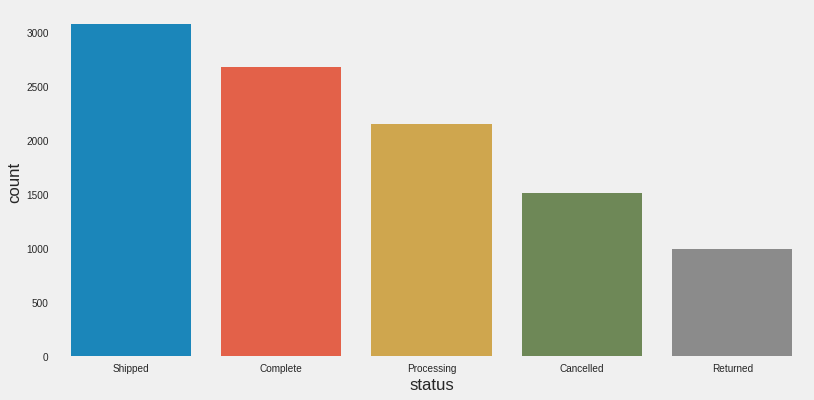

In [ ]:
plot_count(x="status", data=df2)

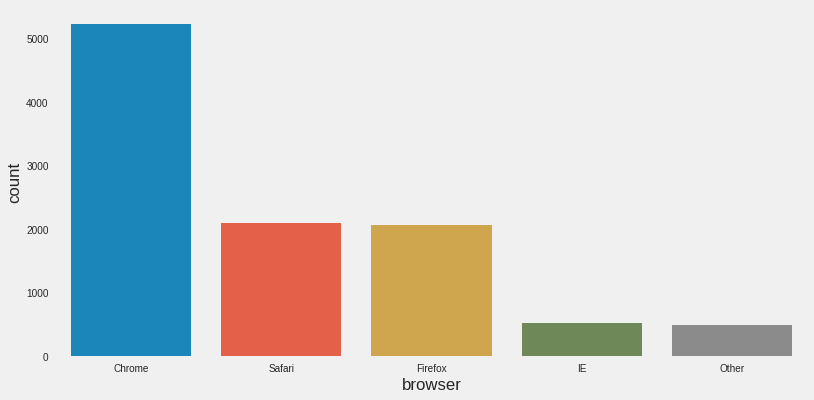

In [ ]:
plot_count(x="browser", data=df2)

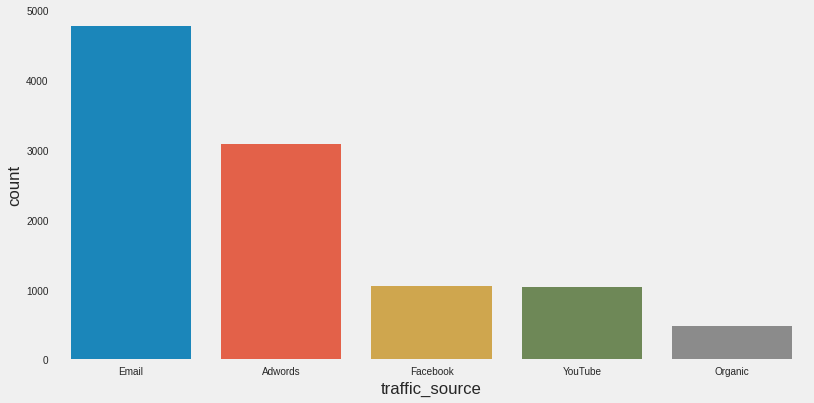

In [ ]:
plot_count(x="traffic_source", data=df2)

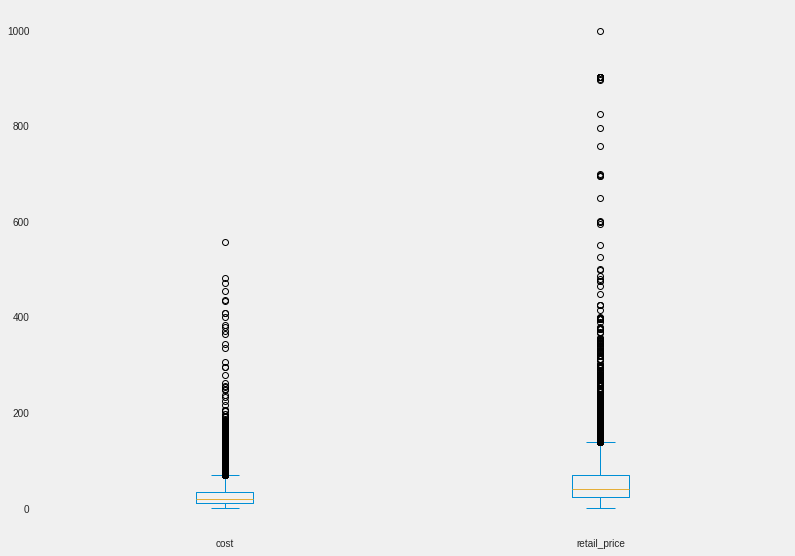

In [ ]:
# Visualisasikan fitur-fitur numerik ke Boxplot untuk melihat bagaimana data tersebar
df2[numerical_features].plot(kind="box", figsize=(12, 9))
plt.grid(False)
plt.show()

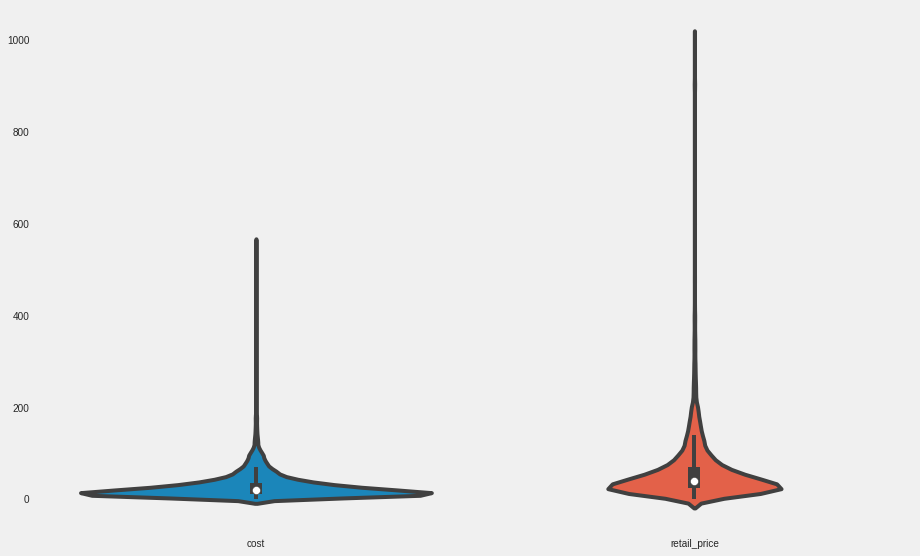

In [ ]:
# Visualisasikan fitur-fitur numerik ke Violin Plot untuk melihat bentuk kurva distribusi data
plt.figure(figsize=(14, 9))
sns.violinplot(data=df2[numerical_features])
plt.grid(False)
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc6f5fc85d0>,
      dtype=object)

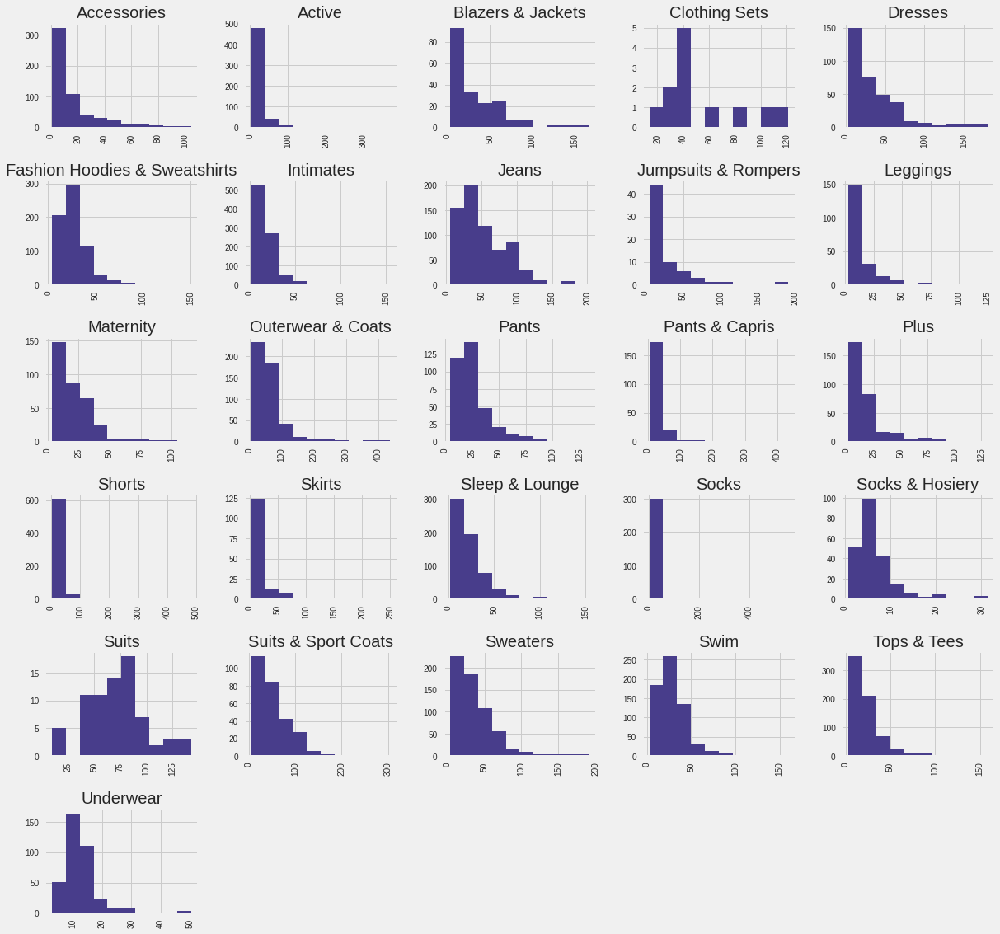

In [ ]:
df2.hist(column='cost', by='category',figsize = (20,20), color = "#483D8B")


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc6f51f4810>,
      dtype=object)

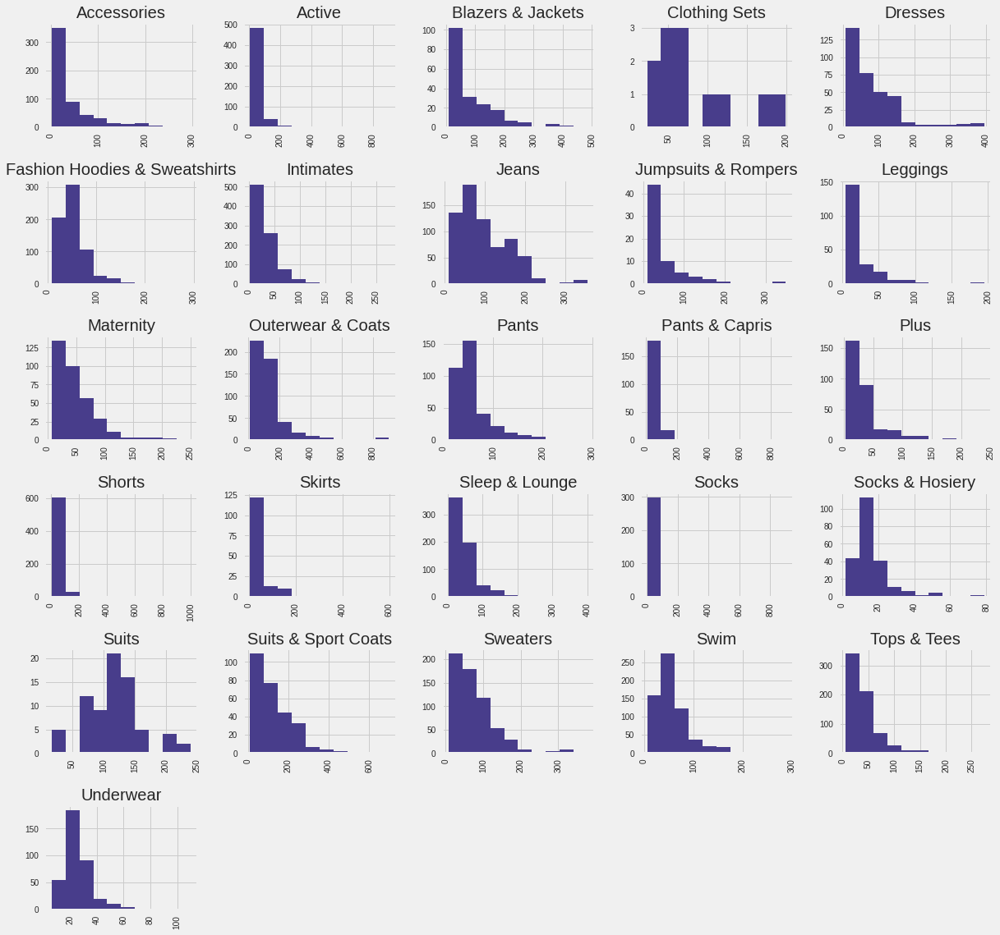

In [ ]:
df2.hist(column='retail_price', by='category',figsize = (20,20), color = "#483D8B")


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc6f4a09fd0>,
      dtype=object)

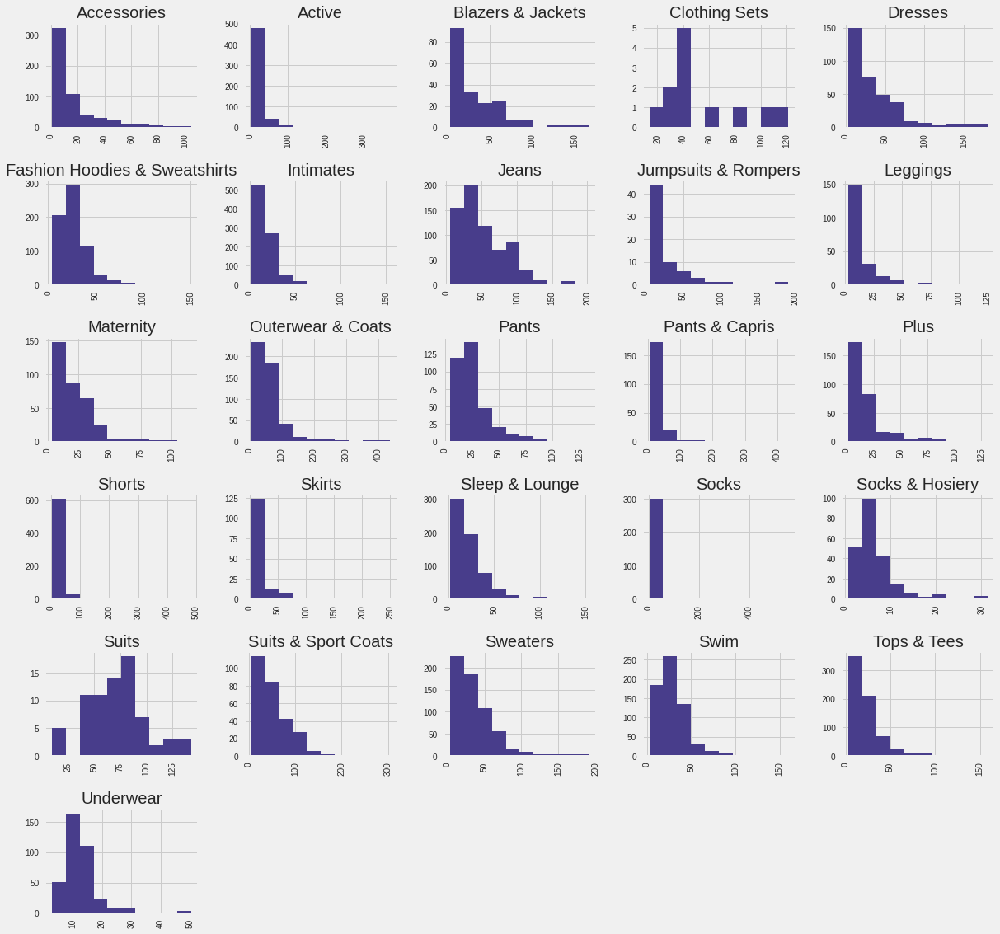

In [ ]:
df2.hist(column='cost', by='category',figsize = (20,20), color = "#483D8B")


##Memodelkan data dengan teknik clustering 

In [ ]:
X = df2

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10444 entries, 0 to 10443
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   10444 non-null  object 
 1   browser                 10444 non-null  object 
 2   traffic_source          10444 non-null  object 
 3   status                  10444 non-null  object 
 4   cost                    10444 non-null  float64
 5   category                10444 non-null  object 
 6   brand                   10444 non-null  object 
 7   retail_price            10444 non-null  float64
 8   department              10444 non-null  object 
 9   distribution_center_id  10444 non-null  int64  
dtypes: float64(2), int64(1), object(7)
memory usage: 816.1+ KB


#Data Preparation 
- Mengubah fitur kategorik menjadi matriks one hot 
- Melakukan stadardisasi semua fitur yang sudah terbentuk 

In [ ]:
encoder = OneHotEncoder()
encoder.fit(X.select_dtypes(include="object"))
X_onehot = pd.DataFrame(encoder.transform(X.select_dtypes(include="object")).toarray(),columns=encoder.get_feature_names_out())

X_preprocessed = pd.concat([X.select_dtypes(exclude="object"), X_onehot],axis=1)

scaler = StandardScaler()
scaler.fit(X_preprocessed)
X_scaled = pd.DataFrame(scaler.transform(X_preprocessed),columns=X_preprocessed.columns)

X_scaled.head()

cost  retail_price  distribution_center_id  state_Acre  state_Aichi  \
0  0.492119      0.365654               -1.376001   -0.016951     -0.01384   
1  2.139671      1.729605                0.683268   -0.016951     -0.01384   
2  0.097836      0.320495                0.340057   -0.016951     -0.01384   
3 -0.144989     -0.214522                0.683268   -0.016951     -0.01384   
4 -0.200588     -0.138135               -0.689578   -0.016951     -0.01384   

   state_Alabama  state_Alagoas  state_Alaska  state_Amapá  state_Amazonas  \
0      -0.037925      -0.044886     -0.019574    -0.037925       -0.073422   
1      -0.037925      -0.044886     -0.019574    -0.037925       -0.073422   
2      -0.037925      -0.044886     -0.019574    -0.037925       -0.073422   
3      -0.037925      -0.044886     -0.019574    -0.037925       -0.073422   
4      -0.037925      -0.044886     -0.019574    -0.037925       -0.073422   

   state_Andalucía  state_Anhui  state_Aragón  state_Arizona  state_Arkansas  \
0        -0.082733    -0.093754     -0.030958      -0.070051       -0.040378   
1        -0.082733    -0.093754     -0.030958      -0.070051       -0.040378   
2        -0.082733    -0.093754     -0.030958      -0.070051       -0.040378   
3        -0.082733    -0.093754     -0.030958      -0.070051       -0.040378   
4        -0.082733    -0.093754     -0.030958      -0.070051       -0.040378   

   state_Australian Capital Territory  state_Auvergne-Rhône-Alpes  \
0                           -0.019574                   -0.082144   
1                           -0.019574                   -0.082144   
2                           -0.019574                   -0.082144   
3                           -0.019574                   -0.082144   
4                           -0.019574                   -0.082144   

   state_Baden-Württemberg  state_Bagmati region  state_Bahia  state_Bayern  \
0                -0.077902             -0.023975    -0.115291     -0.065783   
1                -0.077902             -0.023975    -0.115291     -0.065783   
2                -0.077902             -0.023975    -0.115291     -0.065783   
3                -0.077902             -0.023975    -0.115291     -0.065783   
4                -0.077902             -0.023975    -0.115291     -0.065783   

   state_Beijing  state_Berlin  state_Bourgogne-Franche-Comté  \
0       -0.13685     -0.050911                      -0.030958   
1       -0.13685     -0.050911                      -0.030958   
2       -0.13685     -0.050911                      -0.030958   
3       -0.13685     -0.050911                      -0.030958   
4       -0.13685     -0.050911                      -0.030958   

   state_Brandenburg  state_Bremen  state_Bretagne  state_Brussels  \
0          -0.037925      -0.01384       -0.043802       -0.032471   
1          -0.037925      -0.01384       -0.043802       -0.032471   
2          -0.037925      -0.01384       -0.043802       -0.032471   
3          -0.037925      -0.01384       -0.043802       -0.032471   
4          -0.037925      -0.01384       -0.043802       -0.032471   

   state_Busan  state_California  state_Canarias  state_Cantabria  \
0    -0.062005         -0.193518       -0.042691         -0.01384   
1    -0.062005         -0.193518       -0.042691         -0.01384   
2    -0.062005         -0.193518       -0.042691         -0.01384   
3    -0.062005         -0.193518       -0.042691         -0.01384   
4    -0.062005         -0.193518       -0.042691         -0.01384   

   state_Castilla y León  state_Castilla-La Mancha  state_Cataluña  \
0              -0.036637                 -0.041551       -0.091119   
1              -0.036637                 -0.041551       -0.091119   
2              -0.036637                 -0.041551       -0.091119   
3              -0.036637                 -0.041551       -0.091119   
4              -0.036637                 -0.041551       -0.091119   

   state_Ceará  state_Centre-Val de Loire  state_C

##**K-MEANS**

In [ ]:
K = 5
kmeans_5 = KMeans(n_clusters=K, random_state=11)

start = time()
kmeans_5.fit(X_scaled)
print(f"Done fitting kMeans in {time()-start:.3f}s")

Done fitting kMeans in 5.093s


In [ ]:
K = 15
kmeans_15 = KMeans(n_clusters=K, random_state=11)

start = time()
kmeans_15.fit(X_scaled)
print(f"Done fitting kMeans in {time()-start:.3f}s")

Done fitting kMeans in 18.625s


In [ ]:
K = 15
mb_kmeans_15 = MiniBatchKMeans(n_clusters=K)

start = time()
mb_kmeans_15.fit(X_scaled)
print(f"Done fitting kMeans in {time()-start:.3f}s")

Done fitting kMeans in 1.534s


In [ ]:
X = X.assign(
    clusters_of_5=kmeans_5.predict(X_scaled),
    clusters_of_15=kmeans_15.predict(X_scaled),
    clusters_of_15_mb=mb_kmeans_15.predict(X_scaled),
)

with pd.option_context("display.max_columns", None):
    display(X.head())

,state,browser,traffic_source,status,cost,category,brand,retail_price,department,distribution_center_id,clusters_of_5,clusters_of_15,clusters_of_15_mb
0,Guangdong,Safari,Email,Shipped,43.356701,Jeans,Ariat,82.900002,Men,1,2,2,14
1,Tianjin,Firefox,Email,Cancelled,93.568000,Pants & Capris,J BRAND,172.000000,Women,7,2,1,14
2,North Carolina,Chrome,Adwords,Shipped,31.340399,Suits & Sport Coats,Cardi International,79.949997,Men,6,2,2,14
3,Extremadura,Firefox,Organic,Shipped,23.940000,Jeans,Harbor Bay,45.000000,Men,7,2,2,14
4,Hubei,Chrome,Email,Complete,22.245551,Underwear,Carhartt,49.990002,Men,3,2,2,14


In [ ]:
X = X.assign(
    clusters_of_5=kmeans_5.predict(X_scaled),
    clusters_of_15=kmeans_15.predict(X_scaled),
    clusters_of_15_mb=mb_kmeans_15.predict(X_scaled),
)

with pd.option_context("display.max_columns", None):
    display(X.head())

,state,browser,traffic_source,status,cost,category,brand,retail_price,department,distribution_center_id,clusters_of_5,clusters_of_15,clusters_of_15_mb
0,Guangdong,Safari,Email,Shipped,43.356701,Jeans,Ariat,82.900002,Men,1,2,2,14
1,Tianjin,Firefox,Email,Cancelled,93.568000,Pants & Capris,J BRAND,172.000000,Women,7,2,1,14
2,North Carolina,Chrome,Adwords,Shipped,31.340399,Suits & Sport Coats,Cardi International,79.949997,Men,6,2,2,14
3,Extremadura,Firefox,Organic,Shipped,23.940000,Jeans,Harbor Bay,45.000000,Men,7,2,2,14
4,Hubei,Chrome,Email,Complete,22.245551,Underwear,Carhartt,49.990002,Men,3,2,2,14


##Visualization

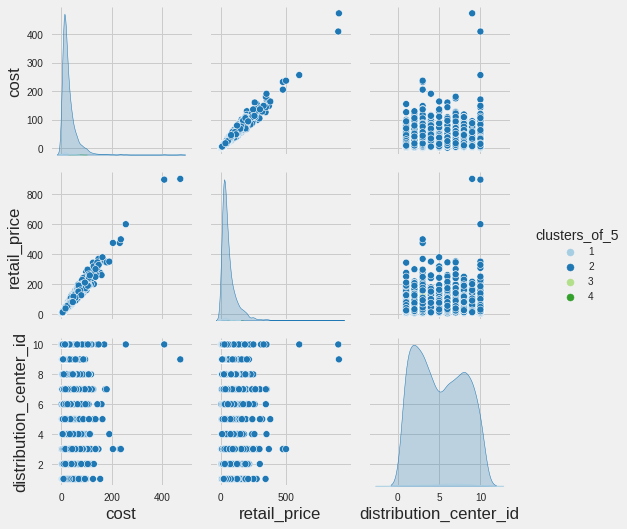

In [ ]:
result = X.sample(frac=.2, random_state=11).drop(columns=["clusters_of_15", "clusters_of_15_mb"])
sns.pairplot(result, hue="clusters_of_5", palette="Paired")
plt.show()

#Model Evaluation

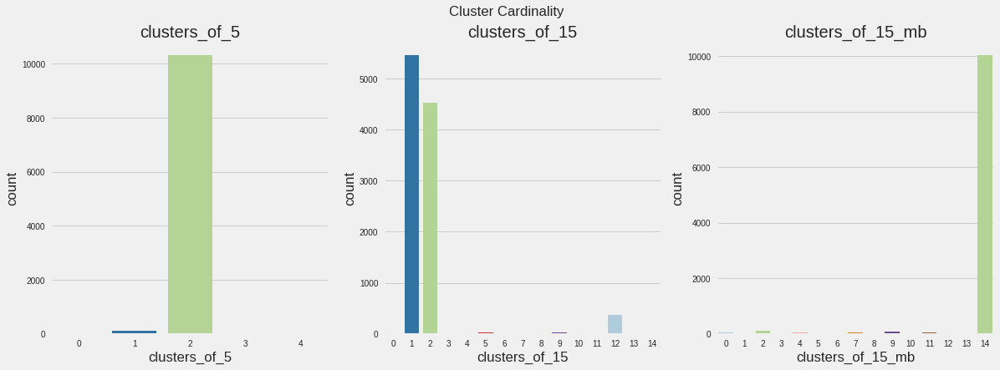

In [ ]:
fig, axis = plt.subplots(1, 3, figsize=(18, 6))
for ax, preds in zip(axis, ["clusters_of_5", "clusters_of_15", "clusters_of_15_mb"]):
    sns.countplot(x=preds, data=X, ax=ax, palette="Paired")
    ax.set_title(preds)
plt.suptitle("Cluster Cardinality")
plt.show()

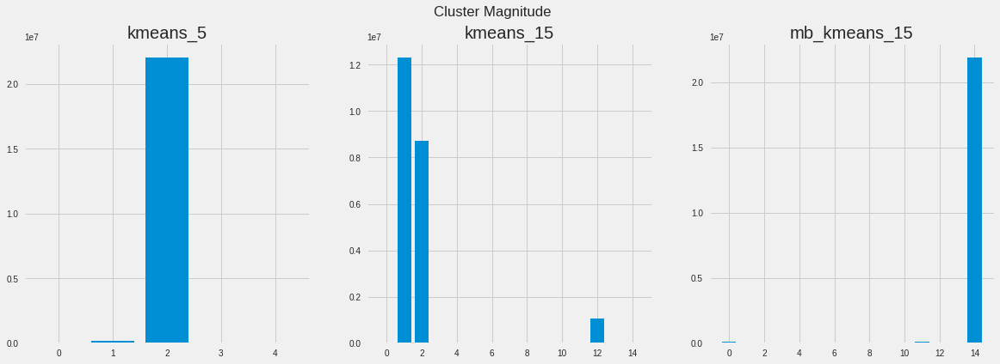

In [ ]:
fig, axis = plt.subplots(1, 3, figsize=(18, 6))
for ax, model, name in zip(axis,[kmeans_5, kmeans_15, mb_kmeans_15],["kmeans_5", "kmeans_15", "mb_kmeans_15"]):
    distances = model.transform(X_scaled)
    preds = model.predict(X_scaled)
    inertia_per_cluster = np.array([sum(dist[c]**2 for dist, c in zip(distances, preds) if c == cluster)
        for cluster in range(model.n_clusters)])
    ax.bar(x=range(model.n_clusters), height=inertia_per_cluster)
    ax.set_title(name)
plt.suptitle("Cluster Magnitude")
plt.show()

In [ ]:
# sum of squared distances
ssd = []

# may take a longer time to run (takes up to approximately 6 min)
for k in range(1, 11):
    model = KMeans(n_clusters=k, random_state=11)
    print(f"Clustering with n_clusters={k}")
    start = time()
    model.fit(X_scaled)
    print(f"Done clustering in {time()-start:.3f}s")

    ssd.append(model.inertia_)

Clustering with n_clusters=1
Done clustering in 2.077s
Clustering with n_clusters=2
Done clustering in 3.303s
Clustering with n_clusters=3
Done clustering in 3.480s
Clustering with n_clusters=4
Done clustering in 4.688s
Clustering with n_clusters=5
Done clustering in 4.988s
Clustering with n_clusters=6
Done clustering in 7.474s
Clustering with n_clusters=7
Done clustering in 7.742s
Clustering with n_clusters=8
Done clustering in 7.954s
Clustering with n_clusters=9
Done clustering in 8.433s
Clustering with n_clusters=10
Done clustering in 10.264s


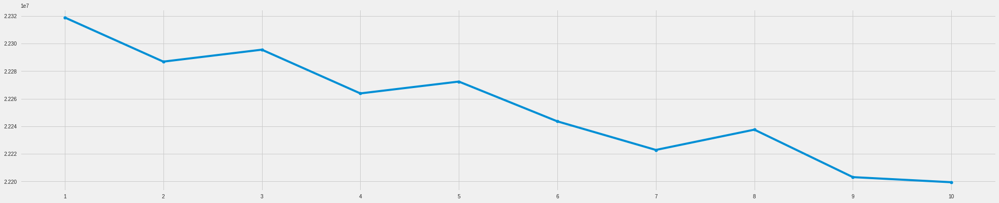

In [ ]:
plt.figure(figsize=(30, 6))
sns.lineplot(x=range(1, 11), y=ssd)
sns.scatterplot(x=range(1, 11), y=ssd)
plt.xticks(range(1, 11))
plt.show()

jumlah cluster yang paling optimal sebanyak 8 buah 

## Silhouette Coefficient 
---



In [ ]:
limit = int(len(X_scaled)*0.2)
X_scaled_sample = X_scaled[0:limit]

In [ ]:
silhouette_scores = []

# INFORMATION
# It may take a longer time to run, the sample data took around 46m 30s to be completed

for k in range(2, 21):
    model = KMeans(n_clusters=k, random_state=11)
    print(f"Clustering with n_clusters={k}")
    start = time()
    model.fit(X_scaled_sample)
    print(f"Done clustering in {time()-start:.3f}s")

    print("Calculating silhouette coefficient..")
    start = time()
    silhouette_scores.append(silhouette_score(X_scaled_sample, model.labels_))
    print(f"Done calculating in {time()-start:.3f}s")

Clustering with n_clusters=2
Done clustering in 0.799s
Calculating silhouette coefficient..
Done calculating in 0.443s
Clustering with n_clusters=3
Done clustering in 1.292s
Calculating silhouette coefficient..
Done calculating in 0.921s
Clustering with n_clusters=4
Done clustering in 1.730s
Calculating silhouette coefficient..
Done calculating in 0.854s
Clustering with n_clusters=5
Done clustering in 3.189s
Calculating silhouette coefficient..
Done calculating in 0.729s
Clustering with n_clusters=6
Done clustering in 2.466s
Calculating silhouette coefficient..
Done calculating in 0.871s
Clustering with n_clusters=7
Done clustering in 2.328s
Calculating silhouette coefficient..
Done calculating in 0.732s
Clustering with n_clusters=8
Done clustering in 4.063s
Calculating silhouette coefficient..
Done calculating in 0.923s
Clustering with n_clusters=9
Done clustering in 3.630s
Calculating silhouette coefficient..
Done calculating in 0.744s
Clustering with n_clusters=10
Done clustering in

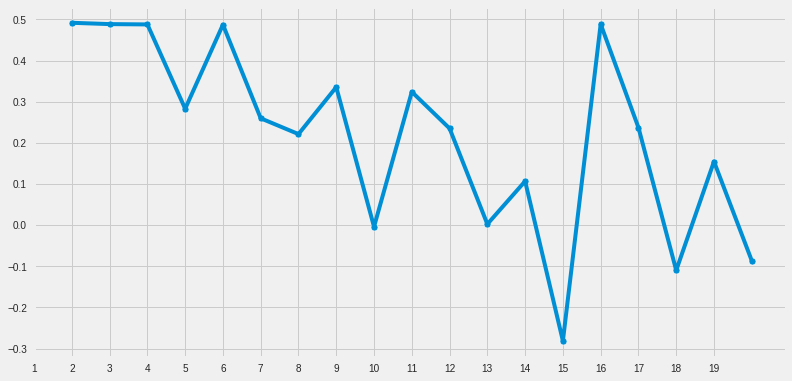

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=range(2, 21), y=silhouette_scores)
sns.scatterplot(x=range(2, 21), y=silhouette_scores)
plt.xticks(range(1, 20))
plt.show()